In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import os
import os.path
from pathlib import Path
import glob

from PIL import Image
from keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import cv2
from keras.applications.vgg16 import preprocess_input, decode_predictions

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from keras import regularizers
from sklearn.preprocessing import LabelEncoder

from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, roc_auc_score, roc_curve
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score

from keras.optimizers import RMSprop,Adam,Optimizer,Optimizer
from tensorflow.keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D, BatchNormalization,MaxPooling2D,BatchNormalization,\
                        Permute, TimeDistributed, Bidirectional,GRU, SimpleRNN, LSTM, GlobalAveragePooling2D, SeparableConv2D
from keras import models
from keras import layers
import tensorflow as tf
from keras.applications import VGG16,VGG19,inception_v3
from keras import backend as K
from keras.utils import plot_model


In [24]:
import os
from pathlib import Path
import kagglehub

path = kagglehub.dataset_download("phylake1337/fire-dataset")
print("Path to dataset files:", path)

data = Path(path) / "fire_dataset"

image_paths = list(data.glob("*/*.jpg")) + list(data.glob("*/*.png"))

labels = [x.parent.name for x in image_paths]

print("FIRE:", labels.count("fire_images"))
print("NO_FIRE:", labels.count("non_fire_images"))


Using Colab cache for faster access to the 'fire-dataset' dataset.
Path to dataset files: /kaggle/input/fire-dataset
FIRE: 755
NO_FIRE: 244


In [25]:
PNG_Path_Series = pd.Series(image_paths,name="PNG").astype(str)
PNG_Labels_Series = pd.Series(labels,name="CATEGORY")

In [26]:
print(PNG_Path_Series)

0      /kaggle/input/fire-dataset/fire_dataset/non_fi...
1      /kaggle/input/fire-dataset/fire_dataset/non_fi...
2      /kaggle/input/fire-dataset/fire_dataset/non_fi...
3      /kaggle/input/fire-dataset/fire_dataset/non_fi...
4      /kaggle/input/fire-dataset/fire_dataset/non_fi...
                             ...                        
994    /kaggle/input/fire-dataset/fire_dataset/fire_i...
995    /kaggle/input/fire-dataset/fire_dataset/fire_i...
996    /kaggle/input/fire-dataset/fire_dataset/fire_i...
997    /kaggle/input/fire-dataset/fire_dataset/fire_i...
998    /kaggle/input/fire-dataset/fire_dataset/fire_i...
Name: PNG, Length: 999, dtype: object


In [27]:
print(PNG_Labels_Series)

0      non_fire_images
1      non_fire_images
2      non_fire_images
3      non_fire_images
4      non_fire_images
            ...       
994        fire_images
995        fire_images
996        fire_images
997        fire_images
998        fire_images
Name: CATEGORY, Length: 999, dtype: object


In [28]:
PNG_Labels_Series.replace({"non_fire_images":"NO_FIRE","fire_images":"FIRE"},inplace=True)

In [29]:
print(PNG_Labels_Series)

0      NO_FIRE
1      NO_FIRE
2      NO_FIRE
3      NO_FIRE
4      NO_FIRE
        ...   
994       FIRE
995       FIRE
996       FIRE
997       FIRE
998       FIRE
Name: CATEGORY, Length: 999, dtype: object


In [30]:
Main_Train_Data = pd.concat([PNG_Path_Series,PNG_Labels_Series],axis=1)

In [31]:
print(Main_Train_Data.head(-1))

                                                   PNG CATEGORY
0    /kaggle/input/fire-dataset/fire_dataset/non_fi...  NO_FIRE
1    /kaggle/input/fire-dataset/fire_dataset/non_fi...  NO_FIRE
2    /kaggle/input/fire-dataset/fire_dataset/non_fi...  NO_FIRE
3    /kaggle/input/fire-dataset/fire_dataset/non_fi...  NO_FIRE
4    /kaggle/input/fire-dataset/fire_dataset/non_fi...  NO_FIRE
..                                                 ...      ...
993  /kaggle/input/fire-dataset/fire_dataset/fire_i...     FIRE
994  /kaggle/input/fire-dataset/fire_dataset/fire_i...     FIRE
995  /kaggle/input/fire-dataset/fire_dataset/fire_i...     FIRE
996  /kaggle/input/fire-dataset/fire_dataset/fire_i...     FIRE
997  /kaggle/input/fire-dataset/fire_dataset/fire_i...     FIRE

[998 rows x 2 columns]


In [32]:
Main_Train_Data = Main_Train_Data.sample(frac=1).reset_index(drop=True)

In [33]:
print(Main_Train_Data.head(-1))

                                                   PNG CATEGORY
0    /kaggle/input/fire-dataset/fire_dataset/fire_i...     FIRE
1    /kaggle/input/fire-dataset/fire_dataset/fire_i...     FIRE
2    /kaggle/input/fire-dataset/fire_dataset/fire_i...     FIRE
3    /kaggle/input/fire-dataset/fire_dataset/fire_i...     FIRE
4    /kaggle/input/fire-dataset/fire_dataset/fire_i...     FIRE
..                                                 ...      ...
993  /kaggle/input/fire-dataset/fire_dataset/fire_i...     FIRE
994  /kaggle/input/fire-dataset/fire_dataset/fire_i...     FIRE
995  /kaggle/input/fire-dataset/fire_dataset/fire_i...     FIRE
996  /kaggle/input/fire-dataset/fire_dataset/fire_i...     FIRE
997  /kaggle/input/fire-dataset/fire_dataset/fire_i...     FIRE

[998 rows x 2 columns]


In [34]:
print(Main_Train_Data["PNG"][2])
print(Main_Train_Data["CATEGORY"][2])
print(Main_Train_Data["PNG"][200])
print(Main_Train_Data["CATEGORY"][200])
print(Main_Train_Data["PNG"][45])
print(Main_Train_Data["CATEGORY"][45])
print(Main_Train_Data["PNG"][852])
print(Main_Train_Data["CATEGORY"][852])

/kaggle/input/fire-dataset/fire_dataset/fire_images/fire.410.png
FIRE
/kaggle/input/fire-dataset/fire_dataset/fire_images/fire.678.png
FIRE
/kaggle/input/fire-dataset/fire_dataset/fire_images/fire.8.png
FIRE
/kaggle/input/fire-dataset/fire_dataset/non_fire_images/non_fire.38.png
NO_FIRE


In [35]:
remove_PNG = '../input/fire-dataset/fire_dataset/non_fire_images/non_fire.189.png'
Main_Train_Data = Main_Train_Data.loc[~(Main_Train_Data.loc[:,'PNG'] == remove_PNG),:]

In [36]:
print(Main_Train_Data.loc[Main_Train_Data.loc[:,'PNG'] == remove_PNG,:])

Empty DataFrame
Columns: [PNG, CATEGORY]
Index: []


In [37]:
print(Main_Train_Data.head(-1))

                                                   PNG CATEGORY
0    /kaggle/input/fire-dataset/fire_dataset/fire_i...     FIRE
1    /kaggle/input/fire-dataset/fire_dataset/fire_i...     FIRE
2    /kaggle/input/fire-dataset/fire_dataset/fire_i...     FIRE
3    /kaggle/input/fire-dataset/fire_dataset/fire_i...     FIRE
4    /kaggle/input/fire-dataset/fire_dataset/fire_i...     FIRE
..                                                 ...      ...
993  /kaggle/input/fire-dataset/fire_dataset/fire_i...     FIRE
994  /kaggle/input/fire-dataset/fire_dataset/fire_i...     FIRE
995  /kaggle/input/fire-dataset/fire_dataset/fire_i...     FIRE
996  /kaggle/input/fire-dataset/fire_dataset/fire_i...     FIRE
997  /kaggle/input/fire-dataset/fire_dataset/fire_i...     FIRE

[998 rows x 2 columns]


In [38]:
plt.style.use("dark_background")

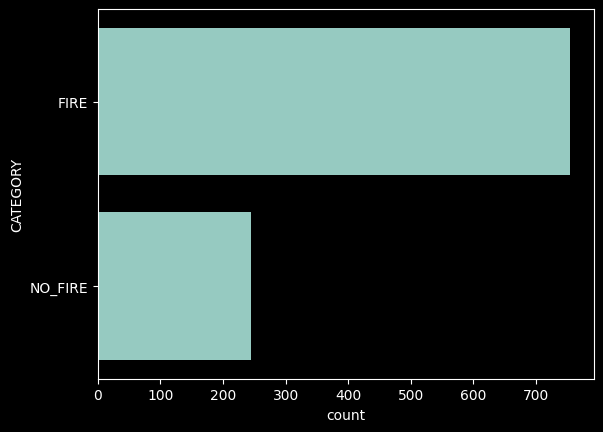

In [39]:
sns.countplot(Main_Train_Data["CATEGORY"])
plt.show()

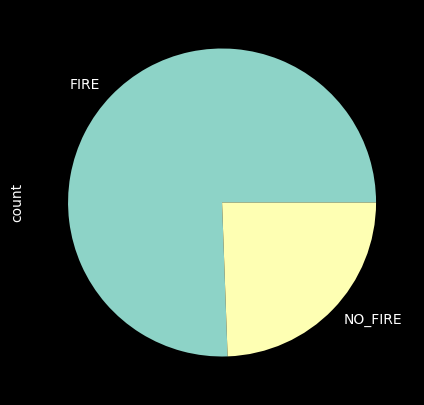

In [40]:
Main_Train_Data['CATEGORY'].value_counts().plot.pie(figsize=(5,5))
plt.show()

Text(0.5, 1.0, 'FIRE')

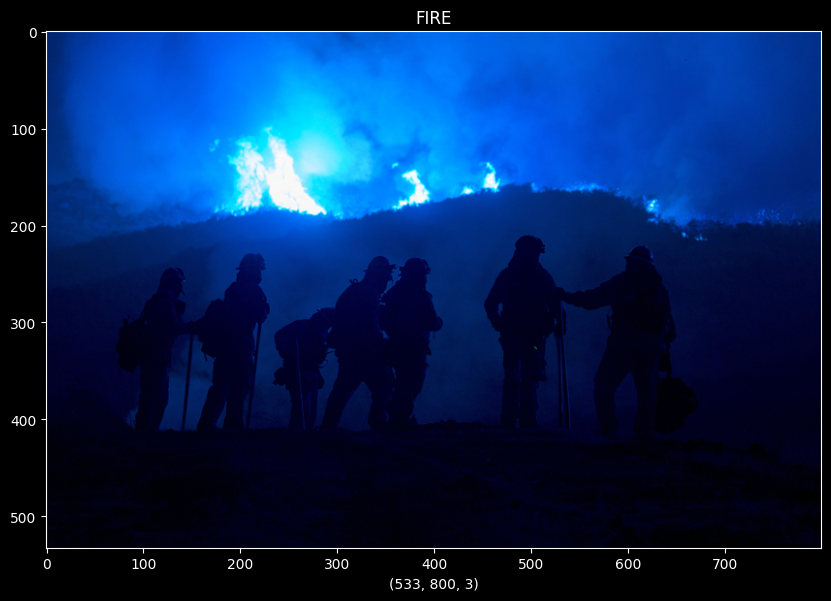

In [46]:
figure = plt.figure(figsize=(10,10))
x = cv2.imread(Main_Train_Data["PNG"][2])
plt.imshow(x)
plt.xlabel(x.shape)
plt.title(Main_Train_Data["CATEGORY"][2])

Text(0.5, 1.0, 'FIRE')

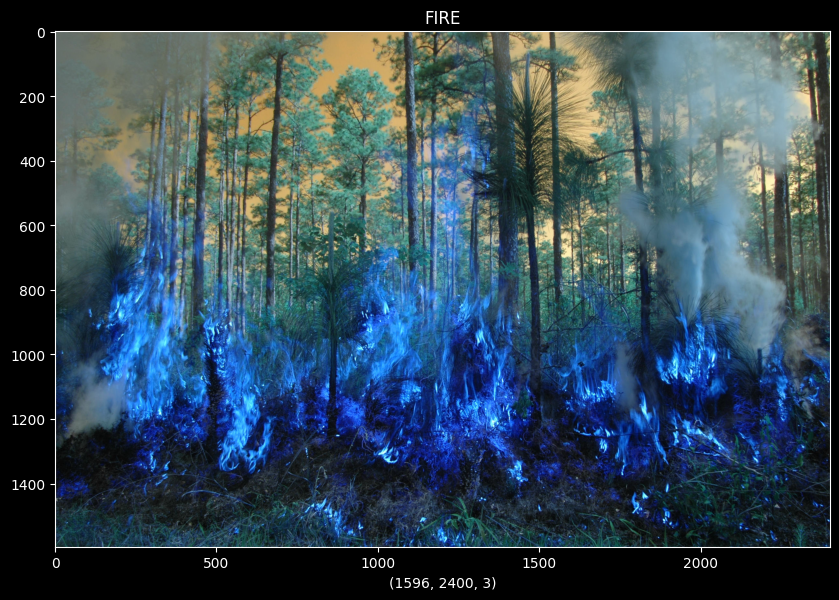

In [43]:
figure = plt.figure(figsize=(10,10))
x = cv2.imread(Main_Train_Data["PNG"][995])
plt.imshow(x)
plt.xlabel(x.shape)
plt.title(Main_Train_Data["CATEGORY"][995])

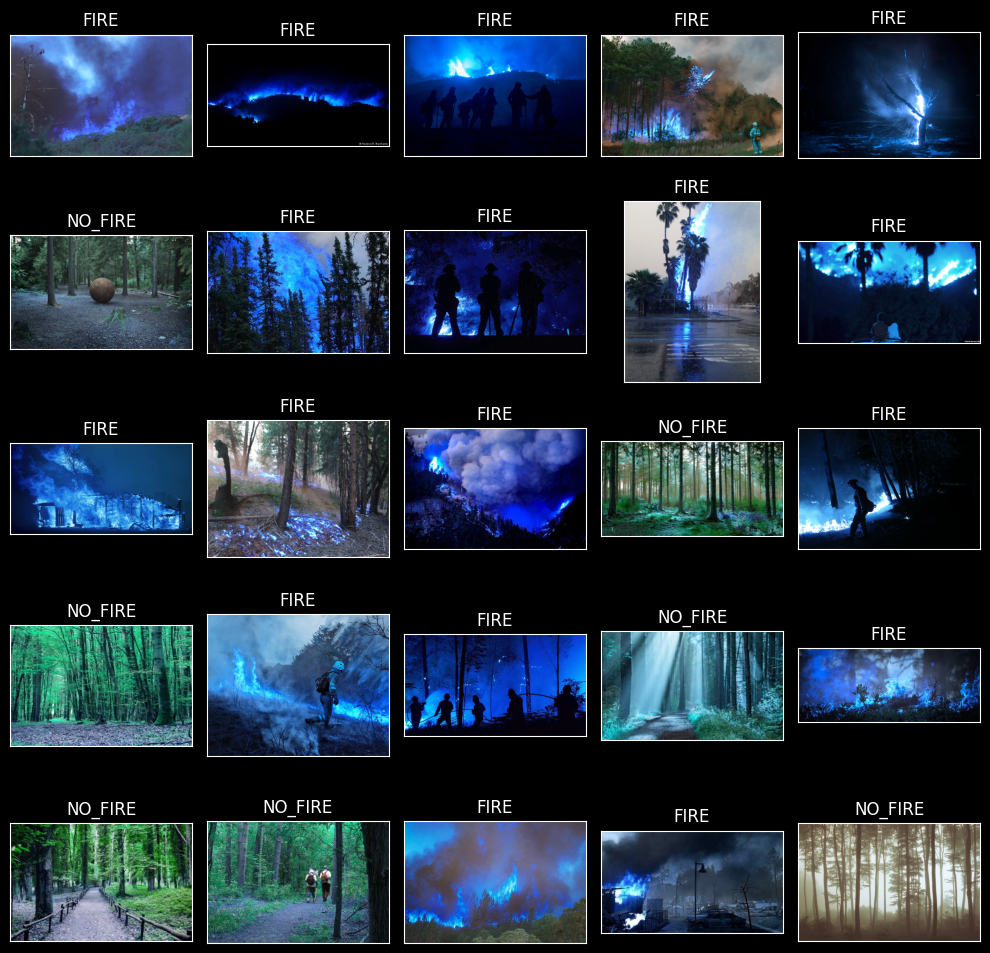

In [47]:
fig, axes = plt.subplots(nrows=5,
                        ncols=5,
                        figsize=(10,10),
                        subplot_kw={"xticks":[],"yticks":[]})

for i,ax in enumerate(axes.flat):
    ax.imshow(cv2.imread(Main_Train_Data["PNG"][i]))
    ax.set_title(Main_Train_Data["CATEGORY"][i])
plt.tight_layout()
plt.show()

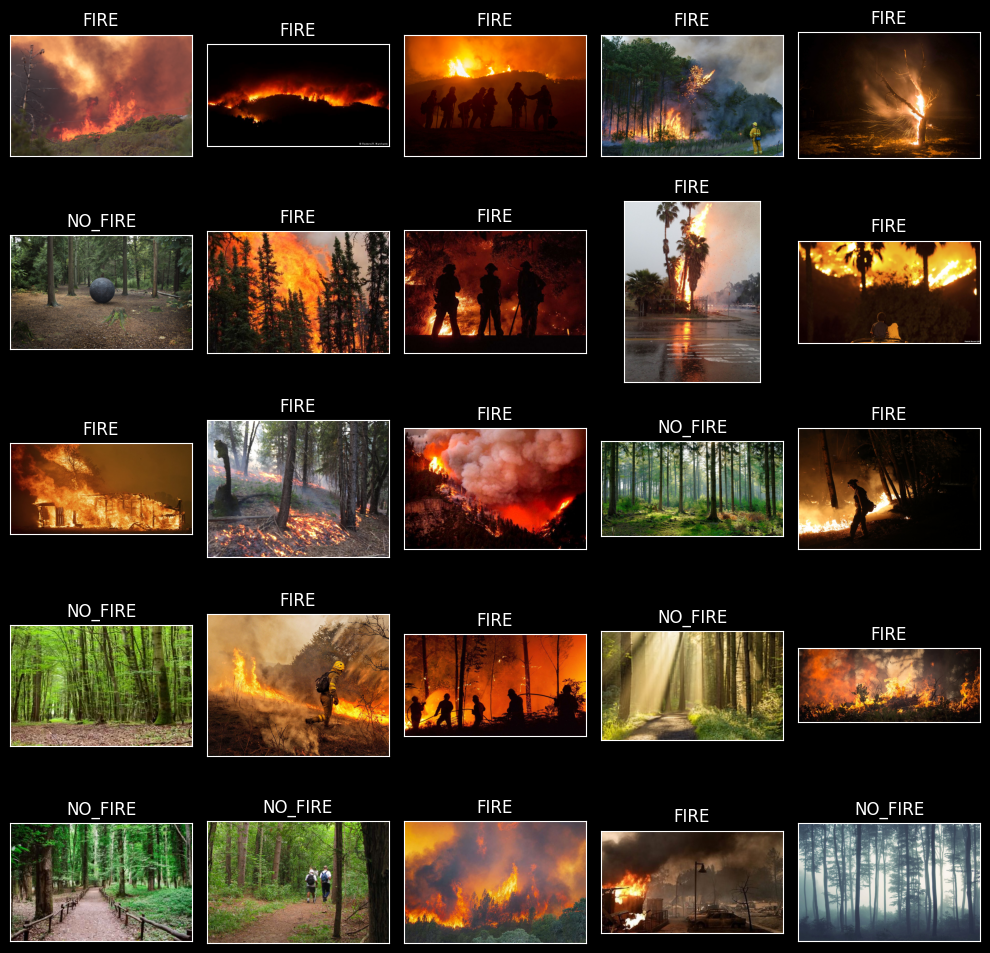

In [48]:
fig, axes = plt.subplots(nrows=5,
                        ncols=5,
                        figsize=(10,10),
                        subplot_kw={"xticks":[],"yticks":[]})

for i,ax in enumerate(axes.flat):
    x = cv2.imread(Main_Train_Data["PNG"][i])
    x = cv2.cvtColor(x,cv2.COLOR_RGB2BGR)
    ax.imshow(x)
    ax.set_title(Main_Train_Data["CATEGORY"][i])
plt.tight_layout()
plt.show()

In [49]:
Train_Generator = ImageDataGenerator(rescale=1./255,
                                    shear_range=0.3,
                                    zoom_range=0.2,
                                    brightness_range=[0.2,0.9],
                                    rotation_range=30,
                                    horizontal_flip=True,
                                    vertical_flip=True,
                                    fill_mode="nearest",
                                    validation_split=0.1)

In [50]:
Test_Generator = ImageDataGenerator(rescale=1./255)

In [51]:
Train_Data,Test_Data = train_test_split(Main_Train_Data,train_size=0.9,random_state=42,shuffle=True)

In [52]:
print("TRAIN SHAPE: ",Train_Data.shape)
print("TEST SHAPE: ",Test_Data.shape)

TRAIN SHAPE:  (899, 2)
TEST SHAPE:  (100, 2)


In [53]:
print(Train_Data.head(-1))
print("----"*20)
print(Test_Data.head(-1))

                                                   PNG CATEGORY
599  /kaggle/input/fire-dataset/fire_dataset/non_fi...  NO_FIRE
432  /kaggle/input/fire-dataset/fire_dataset/fire_i...     FIRE
221  /kaggle/input/fire-dataset/fire_dataset/fire_i...     FIRE
973  /kaggle/input/fire-dataset/fire_dataset/fire_i...     FIRE
525  /kaggle/input/fire-dataset/fire_dataset/fire_i...     FIRE
..                                                 ...      ...
71   /kaggle/input/fire-dataset/fire_dataset/fire_i...     FIRE
106  /kaggle/input/fire-dataset/fire_dataset/non_fi...  NO_FIRE
270  /kaggle/input/fire-dataset/fire_dataset/non_fi...  NO_FIRE
860  /kaggle/input/fire-dataset/fire_dataset/fire_i...     FIRE
435  /kaggle/input/fire-dataset/fire_dataset/fire_i...     FIRE

[898 rows x 2 columns]
--------------------------------------------------------------------------------
                                                   PNG CATEGORY
453  /kaggle/input/fire-dataset/fire_dataset/non_fi...  NO_FIRE

In [54]:
print(Test_Data["CATEGORY"].value_counts())

CATEGORY
FIRE       80
NO_FIRE    20
Name: count, dtype: int64


In [55]:
encode = LabelEncoder()

In [56]:
For_Prediction_Class = encode.fit_transform(Test_Data["CATEGORY"])

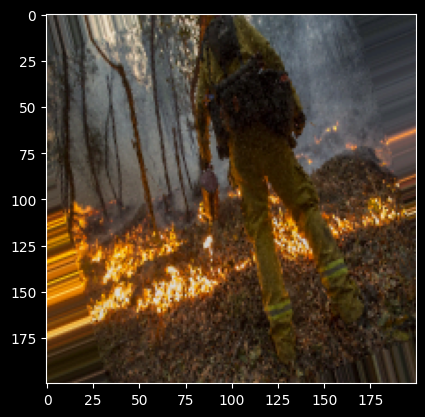

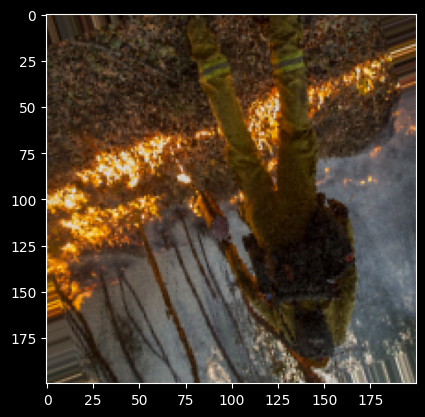

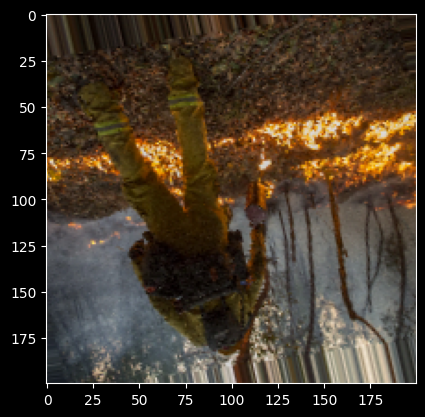

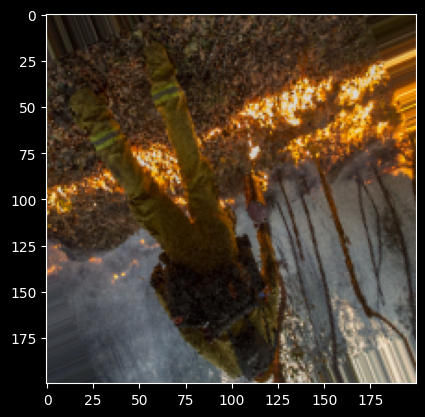

In [57]:
example_Image = Train_Data["PNG"][99]
Load_Image = image.load_img(example_Image,target_size=(200,200))
Array_Image = image.img_to_array(Load_Image)
Array_Image = Array_Image.reshape((1,) + Array_Image.shape)

i = 0
for batch in Train_Generator.flow(Array_Image,batch_size=1):
    plt.figure(i)
    IMG = plt.imshow(image.array_to_img(batch[0]))
    i += 1
    if i % 4 == 0:
        break
plt.show()

In [58]:
Train_IMG_Set = Train_Generator.flow_from_dataframe(dataframe=Train_Data,
                                                   x_col="PNG",
                                                   y_col="CATEGORY",
                                                   color_mode="rgb",
                                                   class_mode="categorical",
                                                   batch_size=32,
                                                   subset="training")

Found 810 validated image filenames belonging to 2 classes.


In [59]:
Validation_IMG_Set = Train_Generator.flow_from_dataframe(dataframe=Train_Data,
                                                   x_col="PNG",
                                                   y_col="CATEGORY",
                                                   color_mode="rgb",
                                                   class_mode="categorical",
                                                   batch_size=32,
                                                   subset="validation")

Found 89 validated image filenames belonging to 2 classes.


In [60]:
Test_IMG_Set = Test_Generator.flow_from_dataframe(dataframe=Test_Data,
                                                 x_col="PNG",
                                                 y_col="CATEGORY",
                                                 color_mode="rgb",
                                                 class_mode="categorical",
                                                 batch_size=32)

Found 100 validated image filenames belonging to 2 classes.


In [61]:
for data_batch,label_batch in Train_IMG_Set:
    print("DATA SHAPE: ",data_batch.shape)
    print("LABEL SHAPE: ",label_batch.shape)
    break

DATA SHAPE:  (32, 256, 256, 3)
LABEL SHAPE:  (32, 2)


In [62]:
for data_batch,label_batch in Validation_IMG_Set:
    print("DATA SHAPE: ",data_batch.shape)
    print("LABEL SHAPE: ",label_batch.shape)
    break

DATA SHAPE:  (32, 256, 256, 3)
LABEL SHAPE:  (32, 2)


In [63]:
for data_batch,label_batch in Test_IMG_Set:
    print("DATA SHAPE: ",data_batch.shape)
    print("LABEL SHAPE: ",label_batch.shape)
    break

DATA SHAPE:  (32, 256, 256, 3)
LABEL SHAPE:  (32, 2)


In [64]:
print("TRAIN: ")
print(Train_IMG_Set.class_indices)
print(Train_IMG_Set.classes[0:5])
print(Train_IMG_Set.image_shape)
print("---"*20)
print("VALIDATION: ")
print(Validation_IMG_Set.class_indices)
print(Validation_IMG_Set.classes[0:5])
print(Validation_IMG_Set.image_shape)
print("---"*20)
print("TEST: ")
print(Test_IMG_Set.class_indices)
print(Test_IMG_Set.classes[0:5])
print(Test_IMG_Set.image_shape)

TRAIN: 
{'FIRE': 0, 'NO_FIRE': 1}
[1, 0, 0, 1, 0]
(256, 256, 3)
------------------------------------------------------------
VALIDATION: 
{'FIRE': 0, 'NO_FIRE': 1}
[1, 0, 0, 0, 0]
(256, 256, 3)
------------------------------------------------------------
TEST: 
{'FIRE': 0, 'NO_FIRE': 1}
[1, 0, 0, 0, 0]
(256, 256, 3)


In [69]:
Model = Sequential()

Model.add(Conv2D(32,(3,3),activation="relu",
                 input_shape=(256,256,3)))
Model.add(BatchNormalization())
Model.add(MaxPooling2D((2,2)))

#
Model.add(Conv2D(64,(3,3),
                 activation="relu",padding="same"))
Model.add(Dropout(0.2))
Model.add(MaxPooling2D((2,2)))

#
Model.add(Conv2D(128,(3,3),
                 activation="relu",padding="same"))
Model.add(Dropout(0.5))
Model.add(MaxPooling2D((2,2)))


#
Model.add(Flatten())
Model.add(Dense(256,activation="relu"))
Model.add(Dropout(0.5))
Model.add(Dense(2,activation="sigmoid"))

In [70]:
Call_Back = tf.keras.callbacks.EarlyStopping(monitor="loss",patience=5,mode="min")

In [71]:
Model.compile(optimizer="rmsprop",loss="binary_crossentropy",metrics=["accuracy"])

In [72]:
CNN_Model = Model.fit(Train_IMG_Set,
                      validation_data=Validation_IMG_Set,
                            callbacks=Call_Back,
                      epochs=50)

Epoch 1/50
26/26 ━━━━━━━━━━━━━━━━━━━━ 53s 2s/step - accuracy: 0.7669 - loss: 10.6368 - val_accuracy: 0.7303 - val_loss: 0.5102
Epoch 2/50
26/26 ━━━━━━━━━━━━━━━━━━━━ 29s 1s/step - accuracy: 0.9316 - loss: 0.1629 - val_accuracy: 0.6966 - val_loss: 0.6026
Epoch 3/50
26/26 ━━━━━━━━━━━━━━━━━━━━ 41s 1s/step - accuracy: 0.9065 - loss: 0.3477 - val_accuracy: 0.7640 - val_loss: 0.4994
Epoch 4/50
26/26 ━━━━━━━━━━━━━━━━━━━━ 29s 1s/step - accuracy: 0.9400 - loss: 0.2123 - val_accuracy: 0.8427 - val_loss: 0.5137
Epoch 5/50
26/26 ━━━━━━━━━━━━━━━━━━━━ 30s 1s/step - accuracy: 0.9225 - loss: 0.3262 - val_accuracy: 0.6966 - val_loss: 0.6181
Epoch 6/50
26/26 ━━━━━━━━━━━━━━━━━━━━ 29s 1s/step - accuracy: 0.9511 - loss: 0.1684 - val_accuracy: 0.8539 - val_loss: 0.5933
Epoch 7/50
26/26 ━━━━━━━━━━━━━━━━━━━━ 30s 1s/step - accuracy: 0.9378 - loss: 0.2395 - val_accuracy: 0.8427 - val_loss: 0.5423


In [73]:
print(Model.summary())

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 254, 254, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 127, 127, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 127, 127, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 63, 63, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 63, 63, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 63, 63, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 31, 31, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 123008)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 256)            │    31,490,304 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 2)              │           514 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 63,168,326 (240.97 MB)

 Trainable params: 31,584,130 (120.48 MB)

 Non-trainable params: 64 (256.00 B)

 Optimizer params: 31,584,132 (120.48 MB)

None


In [74]:
Model_Results = Model.evaluate(Test_IMG_Set)
print("LOSS:  " + "%.4f" % Model_Results[0])
print("ACCURACY:  " + "%.2f" % Model_Results[1])

4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 694ms/step - accuracy: 0.8708 - loss: 0.4506
LOSS:  0.4465
ACCURACY:  0.88


/tmp/ipython-input-2066448211.py:4: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


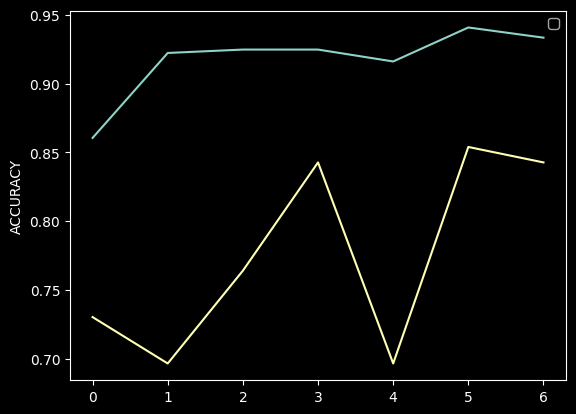

In [75]:
plt.plot(CNN_Model.history["accuracy"])
plt.plot(CNN_Model.history["val_accuracy"])
plt.ylabel("ACCURACY")
plt.legend()
plt.show()

In [79]:
Predict_Class = Model.predict(Test_IMG_Set)

4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 355ms/step


/tmp/ipython-input-1801185673.py:4: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


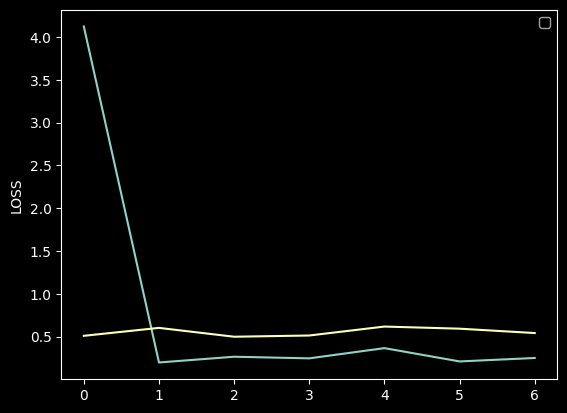

In [80]:
plt.plot(CNN_Model.history["loss"])
plt.plot(CNN_Model.history["val_loss"])
plt.ylabel("LOSS")
plt.legend()
plt.show()

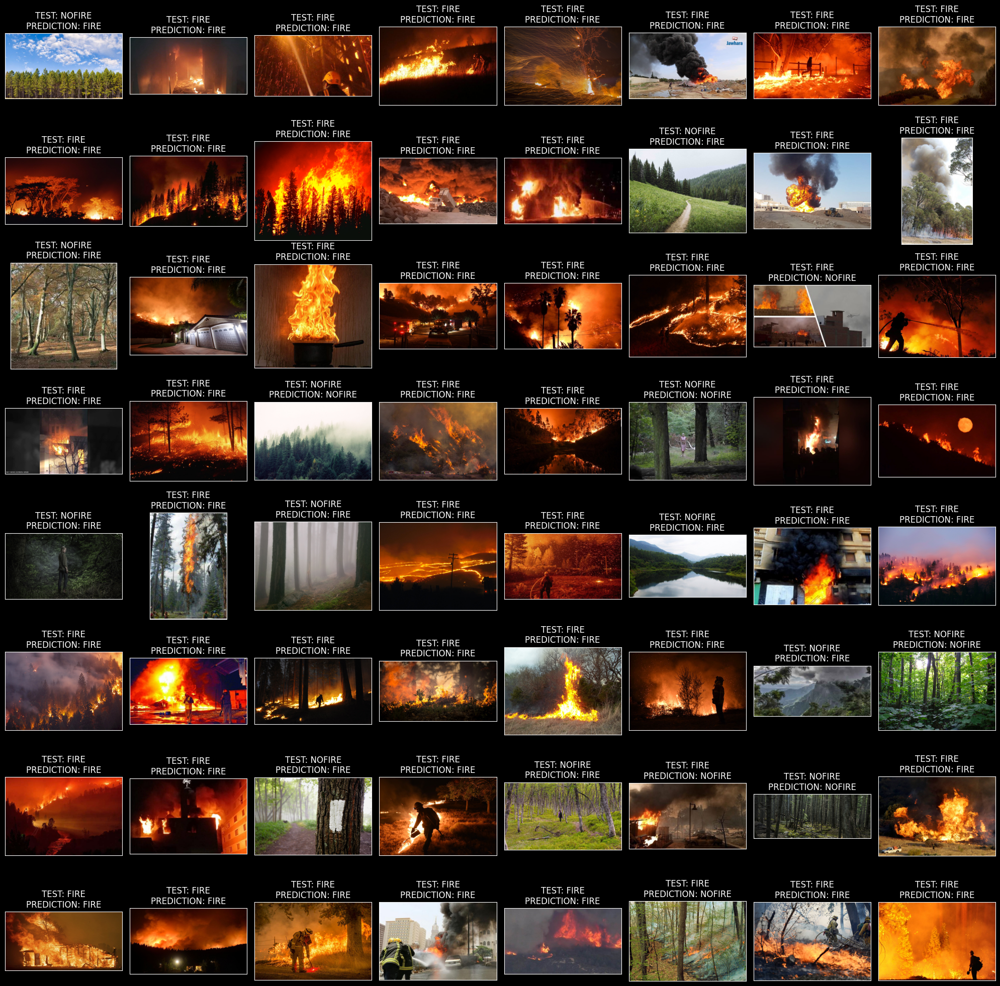

In [93]:

label_map = {0: 'FIRE', 1: 'NOFIRE'}

fig, axes = plt.subplots(nrows=8, ncols=8, figsize=(20, 20), subplot_kw={'xticks': [], 'yticks': []})
for i, ax in enumerate(axes.flat):
    img_path = Test_Data["PNG"].iloc[i]
    img = cv2.imread(img_path)
    if img is None:
        ax.text(0.5, 0.5, f'Image not found:\n{img_path}', ha='center')
        ax.set_xticks([]); ax.set_yticks([])
        continue
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

    true_val = Test_Data.CATEGORY.iloc[i]
    true_label = "FIRE" if str(true_val).upper().startswith("FIRE") else "NOFIRE"


    pred_label = label_map[int(Predict_Class[i])]

    ax.set_title(f"TEST: {true_label}\nPREDICTION: {pred_label}")

plt.tight_layout()
plt.show()
